# 라이브러리 불러오기

In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn

from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.utils import save_image

# Facades 데이터셋 불러오기

In [2]:
%%capture
!wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz -O facades.tar.gz


In [ ]:
!tar -zxvf facades.tar.gz -C ./

In [4]:
print("학습 데이터셋 A와 B의 개수:", len(next(os.walk('./facades/train/'))[2])) #root 아래에 있는 파일들의 갯수
print("평가 데이터셋 A와 B의 개수:", len(next(os.walk('./facades/val/'))[2]))
print("테스트 데이터셋 A와 B의 개수:", len(next(os.walk('./facades/test/'))[2]))

학습 데이터셋 A와 B의 개수: 400
평가 데이터셋 A와 B의 개수: 100
테스트 데이터셋 A와 B의 개수: 106


* 한 쌍의 이미지 출력(왼쪽: 정답 이미지, 오른쪽: 조건 이미지)

이미지 크기:  <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x256 at 0x7F4110791090>


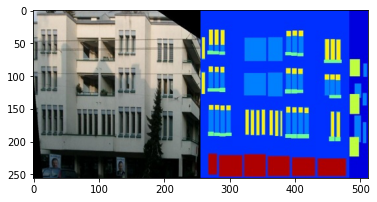

In [5]:
image = Image.open('./facades/train/1.jpg')
print("이미지 크기: ", image) # 각 이미지의 크기는 256 x 256

plt.imshow(image)
plt.show()


# 커스텀 데이터셋 설계

In [6]:
class ImageDataset(Dataset):
    def __init__(self, root, transf = None, mode = 'train'):
        self.transf = transf
        
        self.files = sorted(glob.glob(os.path.join(root, mode) + '/*.jpg'))
        
    def __getitem__(self, index):
        img = Image.open(self.files[index])
        w, h = img.size
        img_Real = img.crop((0, 0, w / 2, h)) # 이미지의 왼쪽 절반
        img_Cond = img.crop((w / 2, 0, w, h)) # 이미지의 오른쪽 절반
        
        img_Real = self.transf(img_Real)
        img_Cond = self.transf(img_Cond)
        
        return {"Real": img_Real, "Condition": img_Cond}
    
    def __len__(self):
        return len(self.files)

In [11]:
transf = transforms.Compose([
    transforms.Resize((256, 256), Image.Resampling.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = ImageDataset('facades', transf = transf)
val_dataset = ImageDataset('facades', transf = transf)

train_dataloader = DataLoader(train_dataset, batch_size = 10, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = 10, shuffle = True)

# 생성자(Generator) & 판별자(Discriminator) 모델 정의

 *Up-Sampling의 필요성
 
신경망을 사용해 이미지를 생성할 때, 일반적으로 저해상도에서 고해상도로 Up Sampling을 진행합니다.

Nearest Neight Interpolation과 같은 다양한 Up-Sampling 연산 방법들이 존재하지만, 이러한 방법들은 네트워크 아키텍쳐를 결정할 때 
직접 적절한 Interpolation 방식을 지정해줘야 하는 수동적인 Feature Engineering을 요구합니다

이와 반대로, **Transposed Convolution**을 사용할 경우, 미리 정의된 Interpolation을 필요로 하지 않으며, 학습 가능한 parameter들이 존재합니다.

Transposed Convolution은 일반적인 Convolution 연산의 역연산으로, matrix A의 cell 1개를 다른 matrix B의 cell 9개와 연결하려고 합니다.

예를 들어 2x2 matrix를 4x4 matrix로 Up-Sampling 할 경우, 이 연산은 1-to-9 Relationship을 형성합니다.


**Transpose Convolution은 일반적인 3x3 kernel을 zero padding을 포함해 1x16 row vector로 구성하고, zero pading을 다른 방법들로 쌓아 4x16 matrix를 만듭니다.**

**4x16**짜리 zero-padding이 포함된 커널을 **Transpose** 시켜 **16x4** matrix로 만든 후, **입력으로 2x2**짜리 matrix가 들어오면 이를 **Flatten** 시켜 **4x1 matrix**로 만듭니다.

마지막으로 **(16x4) x (4x1) 행렬곱**을 진행하게 되면 **16x1짜리 output matrix**가 나옵니다. **이를 다시 4x4 matrix로 만들어주면, 입력으로 들어왔던 2x2 matrix를 4x4 matrix로 Up-Scaling 할 수 있습니다**

https://zzsza.github.io/data/2018/06/25/upsampling-with-transposed-convolution/#convolution-%EC%97%B0%EC%82%B0 

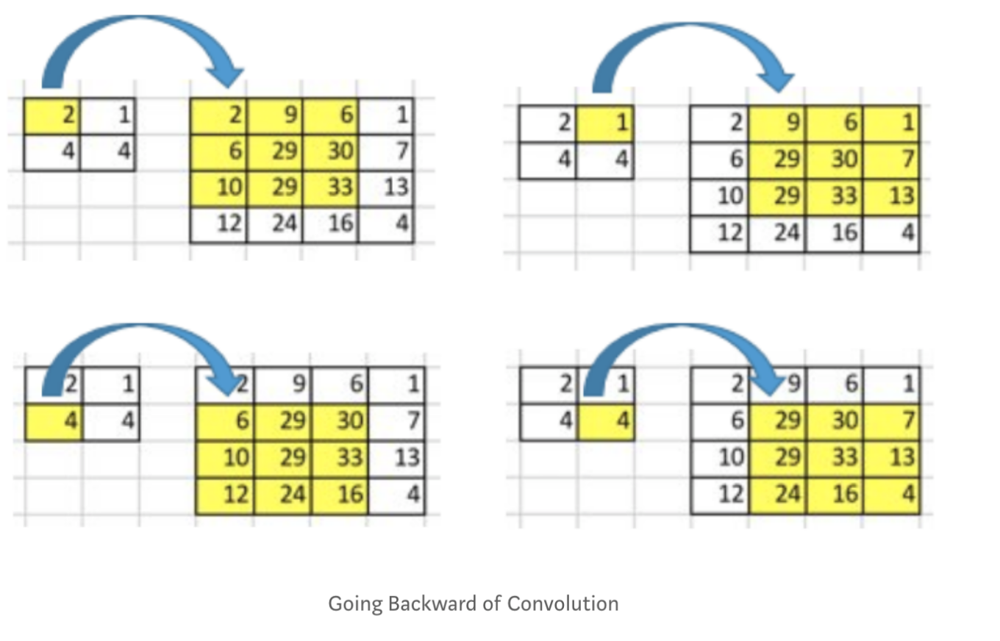

In [33]:
# U-Net 아키텍쳐의 Down Sampling 모듈
class UNetDown(nn.Module):
    def __init__(self, in_channels, out_channels, normalize = True, dropout = 0.0):
        super(UNetDown, self).__init__()
        # (H, W)를 2배씩 감소
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = False)]
        
        if normalize:
            layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2))
        
        if dropout:
            layers.append(nn.Dropout(dropout))
            
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.model(x)
    

# U-Net 아키텍쳐의 Up Sampling 모듈 -> Skip Connection 사용
class UNetUp(nn.Module):
    def __init__(self, in_channels, out_channels, dropout = 0.0):
        super(UNetUp, self).__init__()
        # (H, W)를 2배씩 증가
        layers = [nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = False)]
        layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.ReLU(inplace = True))
        
        if dropout:
            layers.append(nn.Dropout(dropout))
        
        self.model = nn.Sequential(*layers)
        
    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1) # 채널 레벨에서 concatenation
        
        return x
    
# U-Net 생성자(Generator) 설계
class GeneratorUNet(nn.Module):
    def __init__(self, in_channels = 3, out_channels = 3):
        super(GeneratorUNet, self).__init__()
            
        self.down1 = UNetDown(in_channels, 64, normalize = False) # [64 x 128 x 128]
        self.down2 = UNetDown(64, 128) # [128 x 64 x 64]
        self.down3 = UNetDown(128, 256) # [256 x 32 x 32]
        self.down4 = UNetDown(256, 512, dropout = 0.5) # [512 x 16 x 16]
        self.down5 = UNetDown(512, 512, dropout = 0.5) # [512 x 8 x 8]
        self.down6 = UNetDown(512, 512, dropout = 0.5) # [512 x 4 x 4]
        self.down7 = UNetDown(512, 512, dropout = 0.5) # [512 x 2 x 2]
        self.down8 = UNetDown(512, 512, normalize = False, dropout = 0.5) # [512 x 1 x 1]
        
        # Skip Connection 사용 => 출력 채널의 크기 x 2 == 다음 입력 채널의 크기
        # nn.ConvTranspose2d의 출력 H,W 계산식:
        # H_out = (H_in −1) × stride[0] − 2 × padding[0] + dilation[0] × (kernel_size[0] − 1) + output_padding[0] + 1


        self.up1 = UNetUp(512, 512, dropout = 0.5) # [1024 x 2 x 2]
        self.up2 = UNetUp(1024, 512, dropout = 0.5) # [1024 x 4 x 4]
        self.up3 = UNetUp(1024, 512, dropout = 0.5) # [1024 x 8 x 8]
        self.up4 = UNetUp(1024, 512, dropout = 0.5) # [1024 x 16 x 16]
        self.up5 = UNetUp(1024, 256) # [512 x 32 x 32]
        self.up6 = UNetUp(512, 128) # [256 x 64 x 64]
        self.up7 = UNetUp(256, 64) # [128 x 128 x 128]
        
        
        

        self.final = nn.Sequential(
            nn.Upsample(scale_factor = 2), # [128 x 256 x 256]
            nn.ZeroPad2d((1, 0, 1, 0)), # matrix의 Left와 Top에만 zero padding을 적용
            nn.Conv2d(128, out_channels, kernel_size = 4, padding = 1) # [3 x 256 x 256]
        )
        
    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)        
    
    
        
# U-Net 판별자(Discriminator) 설계
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3):
        super(Discriminator, self).__init__()
        
        def discriminator_block(in_channels, out_channels, normalization = True):
            # (H, W) 2배씩 감소
            layers = [nn.Conv2d(in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1)]
            
            if normalization:
                layers.append(nn.InstanceNorm2d(out_channels))
                
            layers.append(nn.LeakyReLU(0.2, inplace = True))
            return layers
        
        self.model = nn.Sequential(
            # img_Real, img_Cond 두개를 입력 받으므로 입력 채널의 크기는 2배
            *discriminator_block(in_channels * 2, 64, normalization = False), # [64 x 128 x 128]
            *discriminator_block(64, 128), # [128 x 64 x 64]
            *discriminator_block(128, 256), # [256 x 32 x 32]
            *discriminator_block(256, 512), # [512 x 16 x 16]
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, kernel_size = 4, padding = 1, bias = False) # [1, 16, 16] Convolutional PatchGAN 분류 모델 사용을 위해 전체 이미지 사용 X
        )
        
    def forward(self, img_Real, img_Cond):
        img_input = torch.cat((img_Real, img_Cond), 1)
        return self.model(img_input)        

# 모델 초기화 및 손실 함수, 학습률, 최적화 함수 설계

In [34]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
        
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

generator = GeneratorUNet().to(device)
discriminator = Discriminator().to(device)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Pix2Pix에서는 L1 loss를 추가로 사용하여 출력 이미지가 ground-truth와 유사해질 수 있도록 한다.
criterion_GAN = torch.nn.MSELoss().to(device)
criterion_pixelwise = torch.nn.L1Loss().to(device)

lr = 2 * 1e-4

optimizer_G = torch.optim.Adam(generator.parameters(), lr = lr, betas = (0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr = lr, betas = (0.5, 0.999))

# 모델 학습

In [35]:
import time

n_epochs = 200
sample_interval = 200

# 변환된 이미지와 정답 이미지 사이의 L1 pixel-wise 손실 가중치 파라미터
lambda_pixel = 100

start_time = time.time()

for epoch in range(n_epochs): 
    for i, batch in enumerate(train_dataloader):
        real_Paint = batch["Condition"].to(device) # 2분할된 이미지의 그림 부분
        real_Photo = batch["Real"].to(device) # 2분할된 이미지의 사진 부분
        #print(batch)
        # 진짜(real) 이미지와 가짜(fake) 이미지에 대한 정답 레이블 생성 (너바와 높이를 16씩 나눈 크기)
        real = torch.FloatTensor(real_Photo.size(0), 1, 16, 16).fill_(1.0).to(device) # 진짜(real): 1
        fake = torch.FloatTensor(real_Photo.size(0), 1, 16, 16).fill_(0.0).to(device) # 가짜(fake): 0
        
        # Generator 학습
        
        optimizer_G.zero_grad()
        
        fake_Photo = generator(real_Paint)
        
        loss_GAN = criterion_GAN(discriminator(fake_Photo, real_Paint), real)
        
        loss_pixel = criterion_pixelwise(fake_Photo, real_Photo) # 실제 정답과 유사하도록
        
        loss_G = loss_GAN + lambda_pixel * loss_pixel
        
        loss_G.backward()
        optimizer_G.step()
        
        # Discriminator 학습
        
        optimizer_D.zero_grad()
        
        loss_real = criterion_GAN(discriminator(real_Photo, real_Paint), real) # condition: real_Paint, 현실적인 이미지를 만들도록
        loss_fake = criterion_GAN(discriminator(fake_Photo.detach(), real_Paint), fake)
        loss_D = (loss_real + loss_fake) / 2
        
        loss_D.backward()
        optimizer_D.step()
        
        done = epoch * len(train_dataloader) + i
        if done % sample_interval == 0:
            imgs = next(iter(val_dataloader)) # 10개의 이미지를 추출해 생성
            real_Paint = batch["Condition"].to(device) # 2분할된 이미지의 그림 부분
            real_Photo = batch["Real"].to(device) # 2분할된 이미지의 사진 부분
            fake_Photo = generator(real_Paint)
            
            # real_Paint: 조건(condition), fake_Photo: 변환된 이미지(translated image), real_Photo: 정답 이미지
            img_sample = torch.cat((real_Paint.data, fake_Photo.data, real_Photo.data), -2) # 높이(height)를 기준으로 이미지를 연결하기
            save_image(img_sample, f"{done}.png", nrow = 5, normalize = True)

    # 하나의 epoch이 끝날 때마다 로그(log) 출력
    print(f"[Epoch {epoch}/{n_epochs}] [D loss: {loss_D.item():.6f}] [G pixel loss: {loss_pixel.item():.6f}, adv loss: {loss_GAN.item()}] [Elapsed time: {time.time() - start_time:.2f}s]")











[Epoch 0/200] [D loss: 0.380277] [G pixel loss: 0.386969, adv loss: 0.6263976097106934] [Elapsed time: 9.33s]
[Epoch 1/200] [D loss: 0.260858] [G pixel loss: 0.381101, adv loss: 0.4684586226940155] [Elapsed time: 17.80s]
[Epoch 2/200] [D loss: 0.185247] [G pixel loss: 0.364326, adv loss: 0.7613159418106079] [Elapsed time: 26.28s]
[Epoch 3/200] [D loss: 0.131308] [G pixel loss: 0.351891, adv loss: 0.7761289477348328] [Elapsed time: 34.74s]
[Epoch 4/200] [D loss: 0.096972] [G pixel loss: 0.345350, adv loss: 0.8759369254112244] [Elapsed time: 43.21s]
[Epoch 5/200] [D loss: 0.101020] [G pixel loss: 0.345048, adv loss: 0.7817339301109314] [Elapsed time: 52.47s]
[Epoch 6/200] [D loss: 0.207508] [G pixel loss: 0.340380, adv loss: 0.5323309302330017] [Elapsed time: 60.93s]
[Epoch 7/200] [D loss: 0.060499] [G pixel loss: 0.332243, adv loss: 0.9853798747062683] [Elapsed time: 69.39s]
[Epoch 8/200] [D loss: 0.066592] [G pixel loss: 0.291737, adv loss: 0.9386985898017883] [Elapsed time: 77.86s]
[E

# 결과물 확인
* 세로순으로 조건 이미지 -> 생성된 이미지 -> 원본 이미지 입니다.

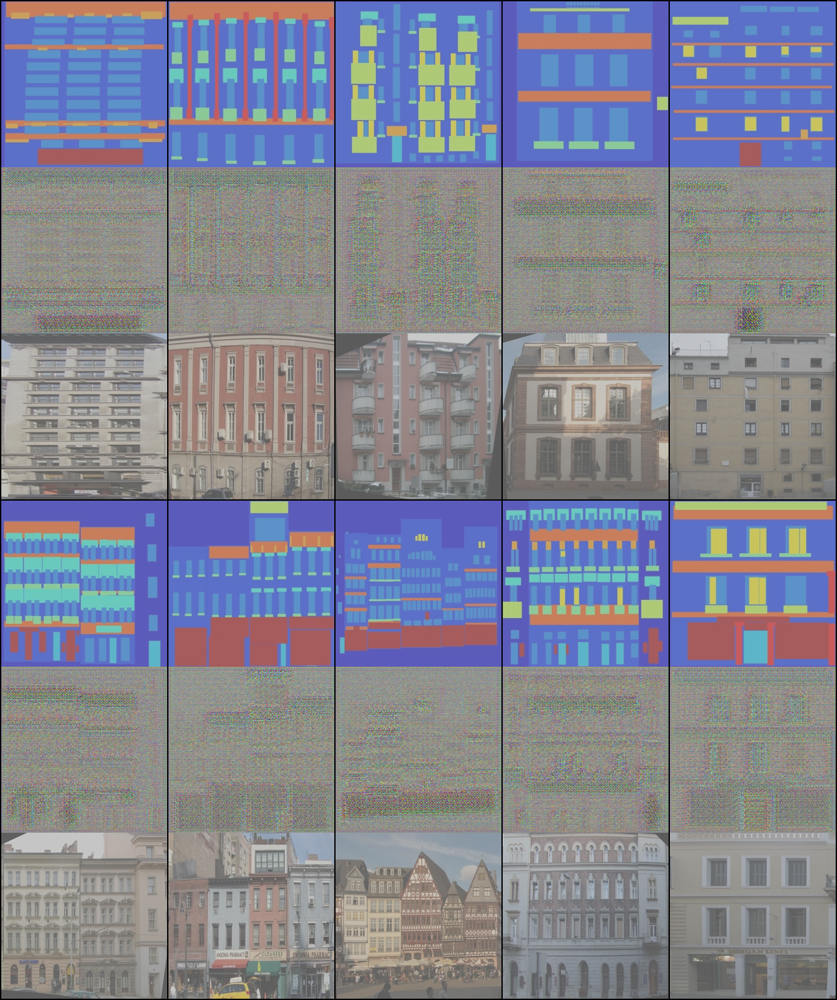

In [42]:
Image('0.png')


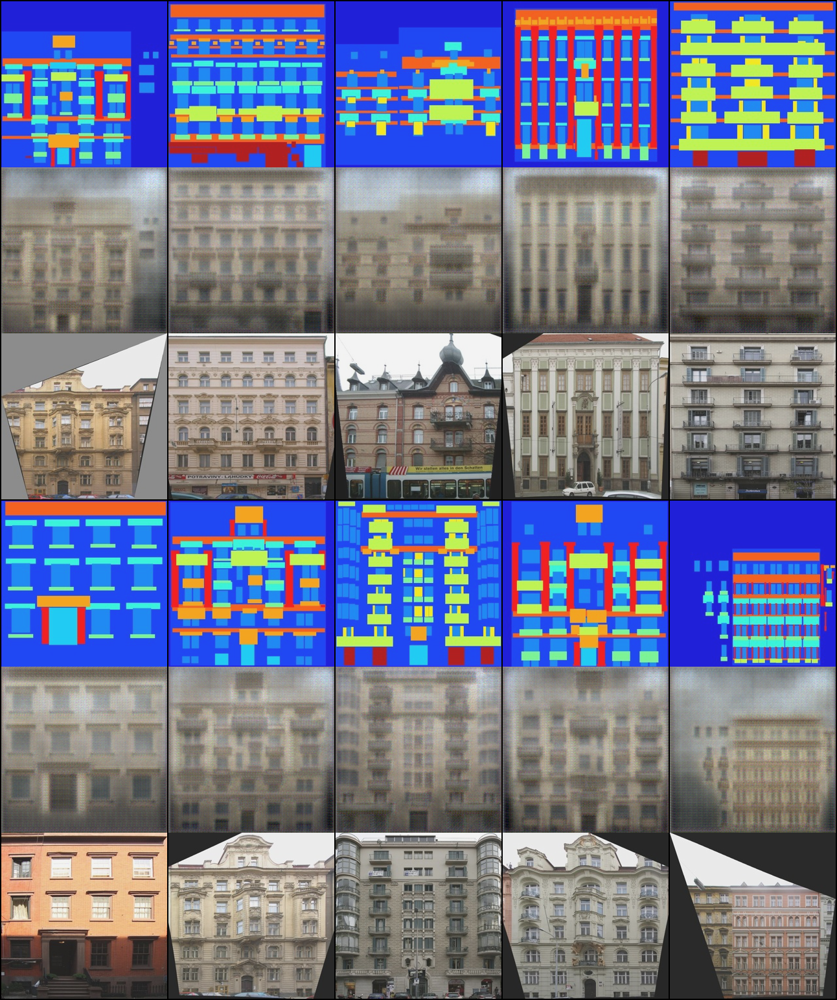

In [39]:
from IPython.display import Image

Image('200.png')


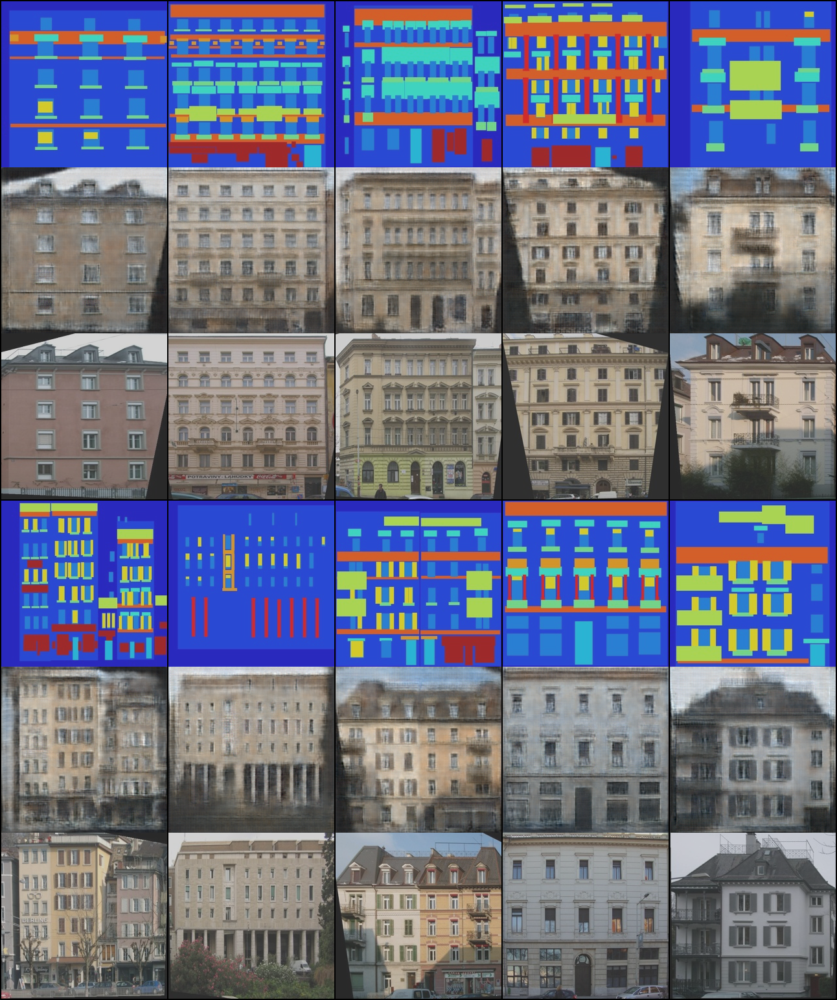

In [43]:
Image('7800.png')
